# **Image Segmentation Using U-Net Model for 13 Classes**

In [3]:
import numpy as np 
import pandas as pd
import os
import random
import glob
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tensorflow.keras.layers import *
from tensorflow.keras import Model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

In [4]:
EPOCHS=20
BATCH_SIZE=32
HEIGHT=256
WIDTH=256
CHANNELS=3
N_CLASSES=13
AUTO = tf.data.AUTOTUNE

# Utility functions

In [5]:
def loadImage(path):
    img = Image.open(path)
    img = np.array(img)
    
    image = img[:,:256]
    image = image / 255.0
    mask = img[:,256:]
    
    return image, mask

def bin_image(mask):
    bins = np.array([20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240])
    new_mask = np.digitize(mask, bins)
    return new_mask

def getSegmentationArr(image, classes, width=WIDTH, height=HEIGHT):
    seg_labels = np.zeros((height, width, classes))
    img = image[:, : , 0]

    for c in range(classes):
        seg_labels[:, :, c] = (img == c ).astype(int)
    return seg_labels

def give_color_to_seg_img(seg, n_classes=N_CLASSES):
    
    seg_img = np.zeros( (seg.shape[0],seg.shape[1],3) ).astype('float')
    colors = sns.color_palette("hls", n_classes)
    
    for c in range(n_classes):
        segc = (seg == c)
        seg_img[:,:,0] += (segc*( colors[c][0] ))
        seg_img[:,:,1] += (segc*( colors[c][1] ))
        seg_img[:,:,2] += (segc*( colors[c][2] ))

    return(seg_img)


In [6]:
train_folder = "../input/cityscapes-image-pairs/cityscapes_data/train"
valid_folder = "../input/cityscapes-image-pairs/cityscapes_data/val"
train_filenames = glob.glob(os.path.join(train_folder, "*.jpg"))
valid_filenames = glob.glob(os.path.join(valid_folder, "*.jpg"))

num_of_training_samples = len(train_filenames) 
num_of_valid_samples = len(valid_filenames)

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, filenames,
                 batch_size=BATCH_SIZE,
                 shuffle=True):

        self.filenames = filenames
        self.batch_size = BATCH_SIZE
        self.shuffle= shuffle
        self.n = len(self.filenames)

    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.filenames)

    def __get_data(self, batches):
        imgs=[]
        segs=[]
        for file in batches:
            image, mask = loadImage(file)
            mask_binned = bin_image(mask)
            labels = getSegmentationArr(mask_binned, N_CLASSES)
            labels = np.argmax(labels, axis=-1)

            imgs.append(image)
            segs.append(labels)

        return np.array(imgs), np.array(segs)

    def __getitem__(self, index):

        batches = self.filenames[index * self.batch_size:(index + 1) * self.batch_size]

        X, y = self.__get_data(batches)

        return (X, y)

    def __len__(self):

        return self.n // self.batch_size

In [7]:
train_gen = DataGenerator(train_filenames)
val_gen = DataGenerator(valid_filenames)

In [8]:
for imgs, segs in train_gen:
    break
imgs.shape, segs.shape

((32, 256, 256, 3), (32, 256, 256))

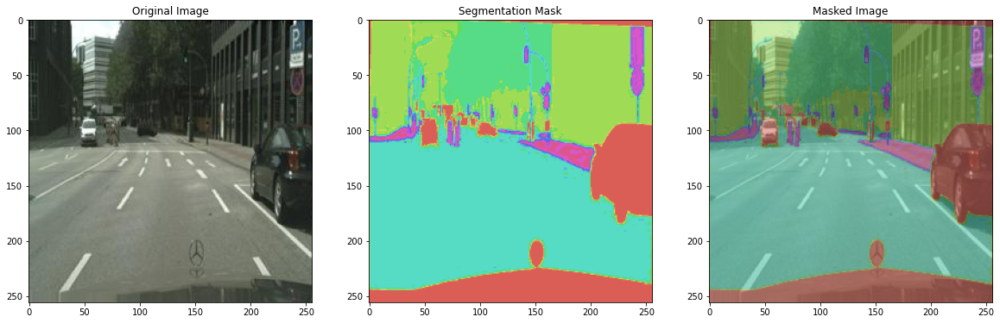

In [9]:
image = imgs[0]
mask = give_color_to_seg_img(segs[0])
masked_image = image * 0.5 + mask * 0.5

fig, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(image)
axs[0].set_title('Original Image')
axs[1].imshow(mask)
axs[1].set_title('Segmentation Mask')
#predimg = cv2.addWeighted(imgs[i]/255, 0.6, _p, 0.4, 0)
axs[2].imshow(masked_image)
axs[2].set_title('Masked Image')
plt.show()

# Loss function

In [11]:
smooth = 1

def dice_coef(y_true, y_pred):
    And = tf.reduce_sum(y_true * y_pred)
    return (2 * And + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def iou(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    sum_ = tf.reduce_sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def jac_distance(y_true, y_pred):
    return 1 - iou(y_true, y_pred)

# Model

In [12]:
def down_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    p = MaxPooling2D((2, 2))(c)
    return c, p

def up_block(x, skip, filters, kernel_size=(3, 3), padding="same", strides=1):
    us = UpSampling2D((2, 2))(x)
    concat = Concatenate()([us, skip])
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(concat)
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

def bottleneck(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

In [13]:
def UNet():
    f = [16, 32, 64, 128, 256]
    inputs = Input((HEIGHT,WIDTH,3))
    
    p0 = inputs
    c1, p1 = down_block(p0, f[0]) #128 -> 64
    c2, p2 = down_block(p1, f[1]) #64 -> 32
    c3, p3 = down_block(p2, f[2]) #32 -> 16
    c4, p4 = down_block(p3, f[3]) #16->8
    
    bn = bottleneck(p4, f[4])
    
    u1 = up_block(bn, c4, f[3]) #8 -> 16
    u2 = up_block(u1, c3, f[2]) #16 -> 32
    u3 = up_block(u2, c2, f[1]) #32 -> 64
    u4 = up_block(u3, c1, f[0]) #64 -> 128
    
    outputs = Conv2D(13, (1, 1), padding="same", activation="sigmoid")(u4)
    model = Model(inputs, outputs)
    return model

In [14]:
def unet():
    main_input = Input(shape=(HEIGHT, WIDTH, CHANNELS), name='img_input')

    ''' ~~~~~~~~~~~~~~~~~~~ ENCODING LAYERS ~~~~~~~~~~~~~~~~~~~ '''
    c1 = Conv2D(32, kernel_size=(3,3), padding='same', name='conv1_1')(main_input)
    c1 = LeakyReLU(0.2, name='leaky1_1')(c1)
    c1 = BatchNormalization(name='bn1_1')(c1)
    c1 = Conv2D(32, kernel_size=(3,3), padding='same', name='conv1_2')(c1)
    c1 = LeakyReLU(0.2, name='leaky1_2')(c1)
    c1 = BatchNormalization(name='bn1_2')(c1)

    p1 = MaxPooling2D((2,2), name='pool1')(c1)

    c2 = Conv2D(64, kernel_size=(3,3), padding='same', name='conv2_1')(p1)
    c2 = LeakyReLU(0.2, name='leaky2_1')(c2)
    c2 = BatchNormalization(name='bn2_1')(c2)
    c2 = Conv2D(64, kernel_size=(3,3), padding='same', name='conv2_2')(c2)
    c2 = LeakyReLU(0.2, name='leaky2_2')(c2)
    c2 = BatchNormalization(name='bn2_2')(c2)

    p2 = MaxPooling2D((2,2), name='pool2')(c2)

    c3 = Conv2D(128, kernel_size=(3,3), padding='same', name='conv3_1')(p2)
    c3 = LeakyReLU(0.2, name='leaky3_1')(c3)
    c3 = BatchNormalization(name='bn3_1')(c3)
    c3 = Conv2D(64, kernel_size=(1,1), padding='same', name='conv3_2')(c3)
    c3 = LeakyReLU(0.2, name='leaky3_2')(c3)
    c3 = BatchNormalization(name='bn3_2')(c3)
    c3 = Conv2D(128, kernel_size=(3,3), padding='same', name='conv3_3')(c3)
    c3 = LeakyReLU(0.2, name='leaky3_3')(c3)
    c3 = BatchNormalization(name='bn3_3')(c3)

    p3 = MaxPooling2D((2,2), name='pool3')(c3)

    c4 = Conv2D(192, kernel_size=(3,3), padding='same', name='conv4_1')(p3)
    c4 = LeakyReLU(0.2, name='leaky4_1')(c4)
    c4 = BatchNormalization(name='bn4_1')(c4)
    c4 = Conv2D(128, kernel_size=(1,1), padding='same', name='conv4_2')(c4)
    c4 = LeakyReLU(0.2, name='leaky4_2')(c4)
    c4 = BatchNormalization(name='bn4_2')(c4)
    c4 = Conv2D(192, kernel_size=(3,3), padding='same', name='conv4_3')(c4)
    c4 = LeakyReLU(0.2, name='leaky4_3')(c4)
    c4 = BatchNormalization(name='bn4_3')(c4)

    p4 = MaxPooling2D((2,2), name='pool4')(c4)

    c5 = Conv2D(192, kernel_size=(3,3), padding='same', name='conv5_1')(p4)
    c5 = LeakyReLU(0.2, name='leaky5_1')(c5)
    c5 = BatchNormalization(name='bn5_1')(c5)


    ''' ~~~~~~~~~~~~~~~~~~~ DECODING LAYERS ~~~~~~~~~~~~~~~~~~~ '''

    u1 = UpSampling2D((2,2), name='upsample1')(c5)
    concat1 = concatenate([c4, u1], name='concat1')

    c6 = Conv2D(128, kernel_size=(3,3), padding='same', name='conv6_1')(concat1)
    c6 = LeakyReLU(0.2, name='leaky6_1')(c6)
    c6 = BatchNormalization(name='bn6_1')(c6)
    c6 = Conv2D(128, kernel_size=(3,3), padding='same', name='conv6_2')(c6)
    c6 = LeakyReLU(0.2, name='leaky6_2')(c6)
    c6 = BatchNormalization(name='bn6_2')(c6)


    u2 = UpSampling2D((2,2), name='upsample2')(c6)
    concat2 = concatenate([c3, u2], name='concat2')

    c7 = Conv2D(64, kernel_size=(3,3), padding='same', name='conv7_1')(concat2)
    c7 = LeakyReLU(0.2, name='leaky7_1')(c7)
    c7 = BatchNormalization(name='bn7_1')(c7)
    c7 = Conv2D(64, kernel_size=(3,3), padding='same', name='conv7_2')(c7)
    c7 = LeakyReLU(0.2, name='leaky7_2')(c7)
    c7 = BatchNormalization(name='bn7_2')(c7)

    u3 = UpSampling2D((2,2), name='upsample3')(c7)
    concat3 = concatenate([c2, u3], name='concat3')

    c8 = Conv2D(32, kernel_size=(3,3), padding='same', name='conv8_1')(concat3)
    c8 = LeakyReLU(0.2, name='leaky8_1')(c8)
    c8 = BatchNormalization(name='bn8_1')(c8)
    c8 = Conv2D(32, kernel_size=(3,3), padding='same', name='conv8_2')(c8)
    c8 = LeakyReLU(0.2, name='leaky8_2')(c8)
    c8 = BatchNormalization(name='bn8_2')(c8)

    u4 = UpSampling2D((2,2), name='upsample4')(c8)
    concat4 = concatenate([c1, u4], name='concat4')

    c9 = Conv2D(16, kernel_size=(1,1), padding='same', name='conv9')(concat4)
    c9 = LeakyReLU(0.2, name='leaky9')(c9)
    c9 = BatchNormalization(name='bn9')(c9)

    mask_out = Conv2D(N_CLASSES, (1,1), padding='same', activation='sigmoid', name='mask_out')(c9)

    model = Model(inputs=[main_input], outputs=[mask_out])
    
    return model 

In [15]:
model = unet()
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_input (InputLayer)          [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_1 (Conv2D)                (None, 256, 256, 32) 896         img_input[0][0]                  
__________________________________________________________________________________________________
leaky1_1 (LeakyReLU)            (None, 256, 256, 32) 0           conv1_1[0][0]                    
__________________________________________________________________________________________________
bn1_1 (BatchNormalization)      (None, 256, 256, 32) 128         leaky1_1[0][0]                   
______________________________________________________________________________________________

# Callbacks

In [16]:
checkpoint = ModelCheckpoint('seg_model_image_seg.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True)

# Training

In [17]:
TRAIN_STEPS = len(train_gen)
VAL_STEPS = len(val_gen)

model.compile(optimizer="adam", loss='sparse_categorical_crossentropy', metrics=["accuracy"])
history = model.fit(train_gen, validation_data=val_gen, steps_per_epoch=TRAIN_STEPS, 
          validation_steps=VAL_STEPS, epochs=EPOCHS, callbacks = [checkpoint])

Epoch 1/20
92/92 [==============================] - 83s 785ms/step - loss: 1.3161 - accuracy: 0.6722 - val_loss: 5.6064 - val_accuracy: 0.3510

Epoch 00001: val_loss improved from inf to 5.60637, saving model to seg_model_image_seg.h5
Epoch 2/20
92/92 [==============================] - 46s 497ms/step - loss: 0.9976 - accuracy: 0.7329 - val_loss: 4.7728 - val_accuracy: 0.3560

Epoch 00002: val_loss improved from 5.60637 to 4.77275, saving model to seg_model_image_seg.h5
Epoch 3/20
92/92 [==============================] - 46s 493ms/step - loss: 0.8834 - accuracy: 0.7600 - val_loss: 1.9688 - val_accuracy: 0.4923

Epoch 00003: val_loss improved from 4.77275 to 1.96877, saving model to seg_model_image_seg.h5
Epoch 4/20
92/92 [==============================] - 46s 504ms/step - loss: 0.8254 - accuracy: 0.7708 - val_loss: 1.6851 - val_accuracy: 0.5165

Epoch 00004: val_loss improved from 1.96877 to 1.68515, saving model to seg_model_image_seg.h5
Epoch 5/20
92/92 [==============================

In [18]:
learning_rate = 1e-4
decay_rate = (learning_rate - 1e-6) / 100
opt = tf.keras.optimizers.Adam(lr=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=None, decay=decay_rate, amsgrad=False)

checkpoint = ModelCheckpoint('seg_model_image_seg_v2.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=["accuracy"])
history2 = model.fit(train_gen, validation_data=val_gen, steps_per_epoch=TRAIN_STEPS, 
          validation_steps=VAL_STEPS, epochs=10, callbacks = [checkpoint])

/opt/conda/lib/python3.7/site-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/10
92/92 [==============================] - 47s 490ms/step - loss: 0.5430 - accuracy: 0.8327 - val_loss: 0.6780 - val_accuracy: 0.7973

Epoch 00001: val_loss improved from inf to 0.67799, saving model to seg_model_image_seg_v2.h5
Epoch 2/10
92/92 [==============================] - 47s 505ms/step - loss: 0.5303 - accuracy: 0.8364 - val_loss: 0.6797 - val_accuracy: 0.7976

Epoch 00002: val_loss did not improve from 0.67799
Epoch 3/10
92/92 [==============================] - 46s 497ms/step - loss: 0.5249 - accuracy: 0.8377 - val_loss: 0.6858 - val_accuracy: 0.7970

Epoch 00003: val_loss did not improve from 0.67799
Epoch 4/10
92/92 [==============================] - 46s 498ms/step - loss: 0.5185 - accuracy: 0.8393 - val_loss: 0.6915 - val_accuracy: 0.7975

Epoch 00004: val_loss did not improve from 0.67799
Epoch 5/10
92/92 [==============================] - 48s 521ms/step - loss: 0.5150 - accuracy: 0.8403 - val_loss: 0.6956 - val_accuracy: 0.7975

Epoch 00005: val_loss did not imp

# Train History

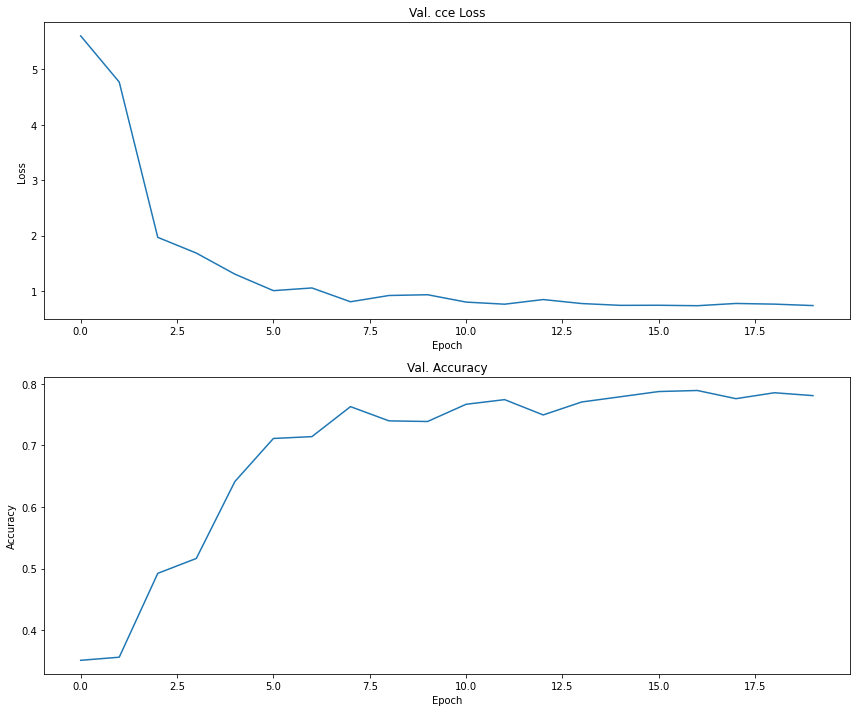

In [19]:
loss = history.history["val_loss"]
acc = history.history["val_accuracy"]

plt.figure(figsize=(12, 10))
plt.subplot(211)
plt.title("Val. cce Loss")
plt.plot(loss)
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(212)
plt.title("Val. Accuracy")
plt.plot(acc)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.tight_layout()
plt.show()

# Visualize outputs

In [20]:
model.load_weights("./seg_model_image_seg_v2.h5")

In [21]:
test_gen = DataGenerator(valid_filenames, 1)

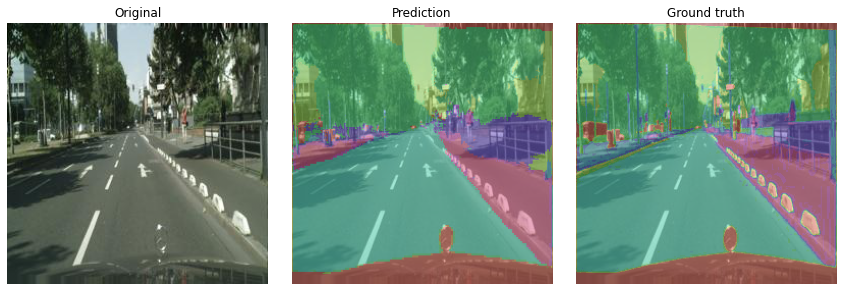

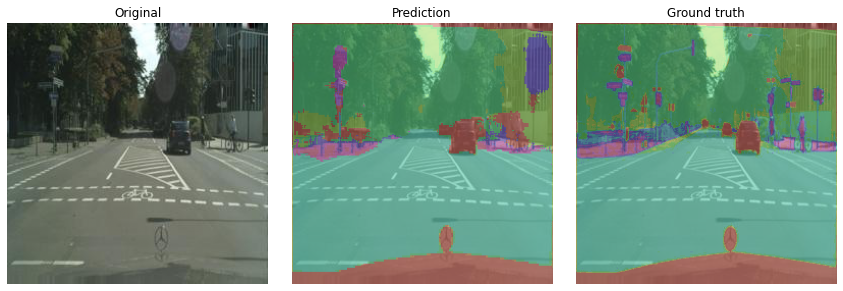

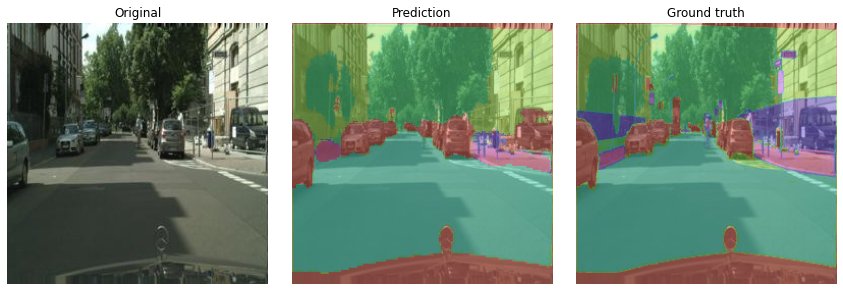

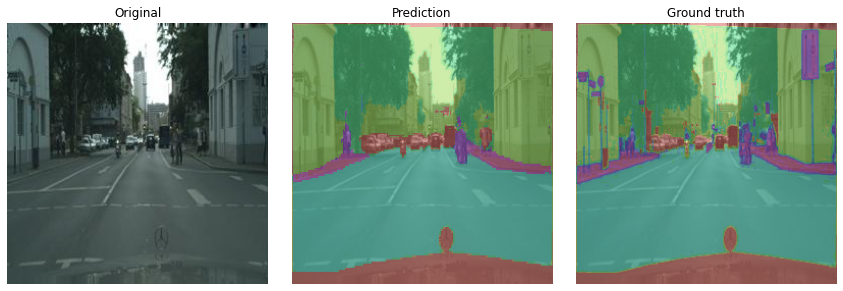

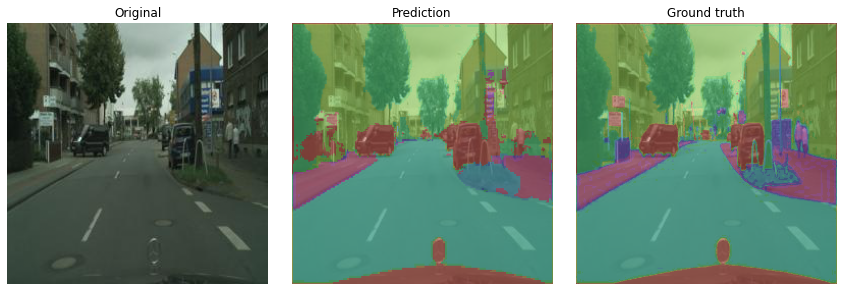

...

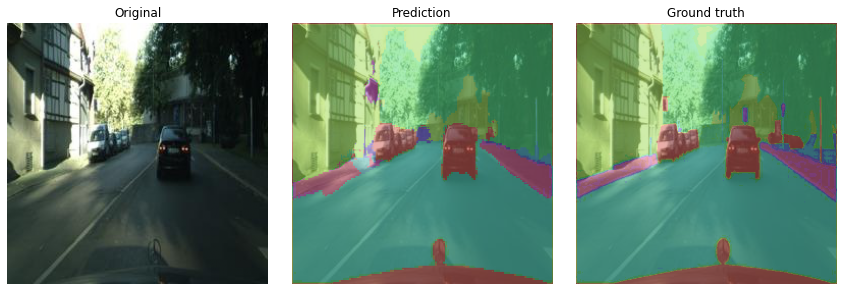

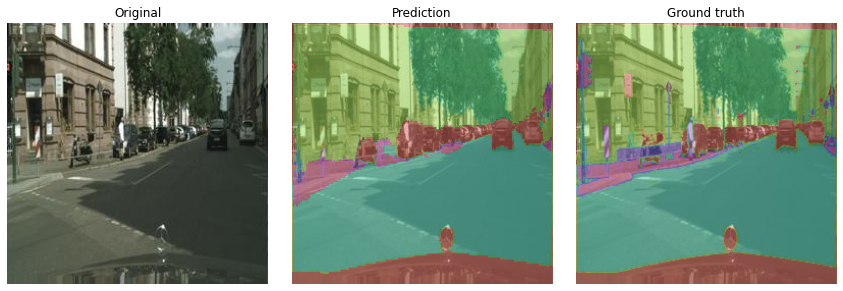

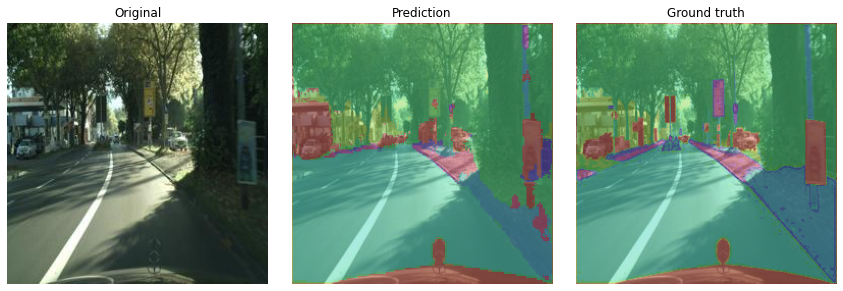

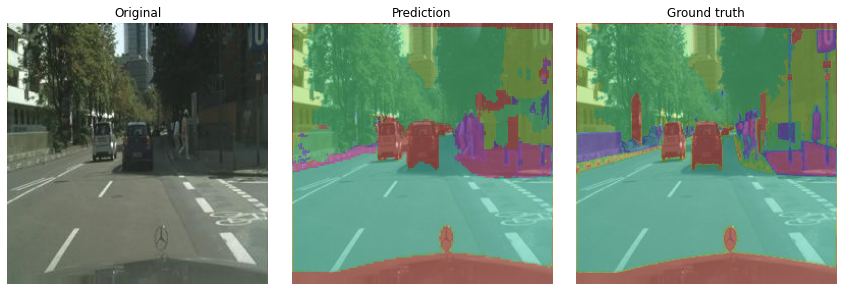

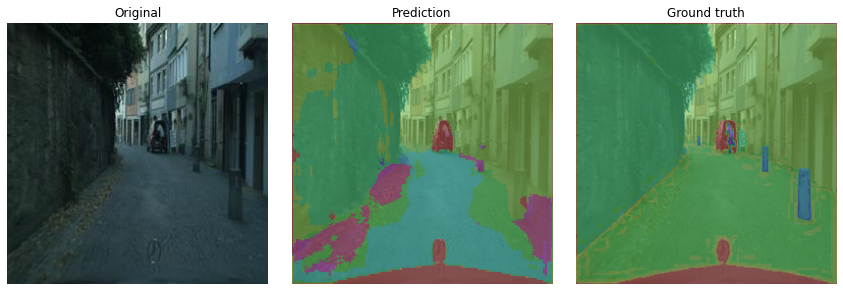

In [22]:
test_iter = iter(test_gen)
for i in range(12):
    imgs, segs = next(test_iter)
    pred = model.predict(imgs)
    _p = give_color_to_seg_img(np.argmax(pred[0], axis=-1))
    _s = give_color_to_seg_img(segs[0])

    predimg = cv2.addWeighted(imgs[0], 0.5, _p, 0.5, 0)
    trueimg = cv2.addWeighted(imgs[0], 0.5, _s, 0.5, 0)
    
    plt.figure(figsize=(12, 4))
    plt.subplot(131)
    plt.title("Original")
    plt.imshow(imgs[0])
    plt.axis("off")
    
    plt.subplot(132)
    plt.title("Prediction")
    plt.imshow(predimg)
    plt.axis("off")
    
    plt.subplot(133)
    plt.title("Ground truth")
    plt.imshow(trueimg)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig("pred_"+str(i)+".png", dpi=150)
    plt.show()

In [23]:
# Assuming your trained model is stored in the variable 'model'
model.save('/kaggle/working/UNet.h5')

# Reducing number of classes to 2

In [24]:
import numpy as np 
import pandas as pd
import os
import random
import glob
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tensorflow.keras.layers import *
from tensorflow.keras import Model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, LeakyReLU, BatchNormalization, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import Sequence

# Custom Dataset of reduced class

In [25]:
# Input directories
train_image_dir = '/kaggle/input/manual-dataset/train_corrected/train_images/correct_originals_train_1000'
train_mask_dir = '/kaggle/input/manual-dataset/train_corrected/train_images/correct_annotated_train_1000'
val_image_dir = '/kaggle/input/manual-dataset/correct_val_original/correct_val_original'
val_mask_dir = '/kaggle/input/manual-dataset/correct_val_annotated/correct_val_annotated'


In [26]:
# Function to load and preprocess images
def load_image(image_path, mask_path):
    image = Image.open(image_path)
    mask = Image.open(mask_path).convert('L')  # Load mask as grayscale

    image = image.resize((256, 256))
    mask = mask.resize((256, 256))

    image = np.array(image) / 255.0
    mask = np.array(mask) / 255.0
    mask = np.expand_dims(mask, axis=-1)  # Add channel dimension

    return image.astype(np.float32), mask.astype(np.float32)


In [27]:
# Create dataset
def create_dataset(image_dir, mask_dir, batch_size=8):
    image_paths = sorted(os.listdir(image_dir))
    mask_paths = sorted(os.listdir(mask_dir))

    image_paths = [os.path.join(image_dir, path) for path in image_paths]
    mask_paths = [os.path.join(mask_dir, path) for path in mask_paths]

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(lambda x, y: tf.numpy_function(load_image, [x, y], [tf.float32, tf.float32]))
    dataset = dataset.batch(batch_size)
    dataset = dataset.repeat()
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    return dataset

In [29]:
# Create the training and validation datasets

train_dataset = create_dataset(train_image_dir, train_mask_dir, batch_size)
val_dataset = create_dataset(val_image_dir, val_mask_dir, batch_size)



In [30]:
# Define the number of steps per epoch
TRAIN_STEPS = len(os.listdir(train_image_dir)) // batch_size
VAL_STEPS = len(os.listdir(val_image_dir)) // batch_size

In [28]:
HEIGHT, WIDTH, CHANNELS = 256, 256, 3  # Example dimensions, adjust as necessary
N_CLASSES = 2  # Number of classes for segmentation
EPOCHS = 10
batch_size = 6

In [31]:
from tensorflow.keras.models import load_model

# Load the saved model
original_model = load_model('/kaggle/input/unet_fine_tuning/other/modified_model_def/1/UNet (2).h5')

In [32]:
# Load the pre-trained model and modify the final layer
def new_unet(n_classes=N_CLASSES):
    main_input = Input(shape=(HEIGHT, WIDTH, CHANNELS), name='img_input')

   # Encoding layers
    c1 = Conv2D(32, kernel_size=(3, 3), padding='same', name='conv2d')(main_input)
    c1 = LeakyReLU(0.2, name='leaky_re_lu')(c1)
    c1 = BatchNormalization(name='batch_normalization')(c1)
    c1 = Conv2D(32, kernel_size=(3, 3), padding='same', name='conv2d_1')(c1)
    c1 = LeakyReLU(0.2, name='leaky_re_lu_1')(c1)
    c1 = BatchNormalization(name='batch_normalization_1')(c1)

    p1 = MaxPooling2D((2, 2), name='max_pooling2d')(c1)

    c2 = Conv2D(64, kernel_size=(3, 3), padding='same', name='conv2d_2')(p1)
    c2 = LeakyReLU(0.2, name='leaky_re_lu_2')(c2)
    c2 = BatchNormalization(name='batch_normalization_2')(c2)
    c2 = Conv2D(64, kernel_size=(3, 3), padding='same', name='conv2d_3')(c2)
    c2 = LeakyReLU(0.2, name='leaky_re_lu_3')(c2)
    c2 = BatchNormalization(name='batch_normalization_3')(c2)

    p2 = MaxPooling2D((2, 2), name='max_pooling2d_1')(c2)

    c3 = Conv2D(128, kernel_size=(3, 3), padding='same', name='conv2d_4')(p2)
    c3 = LeakyReLU(0.2, name='leaky_re_lu_4')(c3)
    c3 = BatchNormalization(name='batch_normalization_4')(c3)
    c3 = Conv2D(64, kernel_size=(1, 1), padding='same', name='conv2d_5')(c3)
    c3 = LeakyReLU(0.2, name='leaky_re_lu_5')(c3)
    c3 = BatchNormalization(name='batch_normalization_5')(c3)
    c3 = Conv2D(128, kernel_size=(3, 3), padding='same', name='conv2d_6')(c3)
    c3 = LeakyReLU(0.2, name='leaky_re_lu_6')(c3)
    c3 = BatchNormalization(name='batch_normalization_6')(c3)

    p3 = MaxPooling2D((2, 2), name='max_pooling2d_2')(c3)

    c4 = Conv2D(192, kernel_size=(3, 3), padding='same', name='conv2d_7')(p3)
    c4 = LeakyReLU(0.2, name='leaky_re_lu_7')(c4)
    c4 = BatchNormalization(name='batch_normalization_7')(c4)
    c4 = Conv2D(128, kernel_size=(1, 1), padding='same', name='conv2d_8')(c4)
    c4 = LeakyReLU(0.2, name='leaky_re_lu_8')(c4)
    c4 = BatchNormalization(name='batch_normalization_8')(c4)
    c4 = Conv2D(192, kernel_size=(3, 3), padding='same', name='conv2d_9')(c4)
    c4 = LeakyReLU(0.2, name='leaky_re_lu_9')(c4)
    c4 = BatchNormalization(name='batch_normalization_9')(c4)

    p4 = MaxPooling2D((2, 2), name='max_pooling2d_3')(c4)

    c5 = Conv2D(192, kernel_size=(3, 3), padding='same', name='conv2d_10')(p4)
    c5 = LeakyReLU(0.2, name='leaky_re_lu_10')(c5)
    c5 = BatchNormalization(name='batch_normalization_10')(c5)

    # Decoding layers
    
    u1 = UpSampling2D((2, 2), name='up_sampling2d')(c5)
    concat1 = concatenate([c4, u1], name='concatenate')

    c6 = Conv2D(128, kernel_size=(3, 3), padding='same', name='conv2d_11')(concat1)
    c6 = LeakyReLU(0.2, name='leaky_re_lu_11')(c6)
    c6 = BatchNormalization(name='batch_normalization_11')(c6)
    c6 = Conv2D(128, kernel_size=(3, 3), padding='same', name='conv2d_12')(c6)
    c6 = LeakyReLU(0.2, name='leaky_re_lu_12')(c6)
    c6 = BatchNormalization(name='batch_normalization_12')(c6)

    u2 = UpSampling2D((2, 2), name='up_sampling2d_1')(c6)
    concat2 = concatenate([c3, u2], name='concatenate_1')

    c7 = Conv2D(64, kernel_size=(3, 3), padding='same', name='conv2d_13')(concat2)
    c7 = LeakyReLU(0.2, name='leaky_re_lu_13')(c7)
    c7 = BatchNormalization(name='batch_normalization_13')(c7)
    c7 = Conv2D(64, kernel_size=(3, 3), padding='same', name='conv2d_14')(c7)
    c7 = LeakyReLU(0.2, name='leaky_re_lu_14')(c7)
    c7 = BatchNormalization(name='batch_normalization_14')(c7)

    u3 = UpSampling2D((2, 2), name='up_sampling2d_2')(c7)
    concat3 = concatenate([c2, u3], name='concatenate_2')

    c8 = Conv2D(32, kernel_size=(3, 3), padding='same', name='conv2d_15')(concat3)
    c8 = LeakyReLU(0.2, name='leaky_re_lu_15')(c8)
    c8 = BatchNormalization(name='batch_normalization_15')(c8)
    c8 = Conv2D(32, kernel_size=(3, 3), padding='same', name='conv2d_16')(c8)
    c8 = LeakyReLU(0.2, name='leaky_re_lu_16')(c8)
    c8 = BatchNormalization(name='batch_normalization_16')(c8)

    u4 = UpSampling2D((2, 2), name='up_sampling2d_3')(c8)
    concat4 = concatenate([c1, u4], name='concatenate_3')

    c9 = Conv2D(16, kernel_size=(3, 3), padding='same', name='conv2d_17')(concat4)
    c9 = LeakyReLU(0.2, name='leaky_re_lu_17')(c9)
    c9 = BatchNormalization(name='batch_normalization_17')(c9)

    
    
    ''' ~~~~~~~~~~~~~~~~~~~ FINAL OUTPUT LAYER ~~~~~~~~~~~~~~~~~~~ '''

    output_layer = Conv2D(n_classes, (1,1), padding='same', activation='sigmoid', name='mask_out')(c9)

    model = Model(inputs=[main_input], outputs=[output_layer])
    return model

In [33]:
# Create and compile the modified U-Net model
model = new_unet(n_classes=N_CLASSES)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_input (InputLayer)          [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         img_input[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 256, 256, 32) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 32) 128         leaky_re_lu[0][0]                
____________________________________________________________________________________________

In [34]:
# Define the number of steps per epoch
TRAIN_STEPS = len(os.listdir(train_image_dir)) // batch_size
VAL_STEPS = len(os.listdir(val_image_dir)) // batch_size

# Create generator for training data
train_gen = iter(train_dataset)

# Create generator for validation data
val_gen = iter(val_dataset)

# Print the results
print("Number of steps per epoch for training:", TRAIN_STEPS)
print("Number of steps per epoch for validation:", VAL_STEPS)

Number of steps per epoch for training: 86
Number of steps per epoch for validation: 62


In [35]:
# Load the weights from the pre-trained model, except the final layer
#pretrained_model = tf.keras.models.load_model('/kaggle/input/unet_fine_tuning/keras/3/1/UNet.h5')
for layer in model.layers:
    if layer.name in [l.name for l in original_model.layers]:
        try:
            layer.set_weights(original_model.get_layer(layer.name).get_weights())
            print(f"Layer {layer.name} weights loaded successfully.")
        except ValueError as e:
            print(f"Error loading weights for layer {layer.name}: {e}")


Layer img_input weights loaded successfully.
Layer conv2d weights loaded successfully.
Layer leaky_re_lu weights loaded successfully.
Layer batch_normalization weights loaded successfully.
Layer conv2d_1 weights loaded successfully.
Layer leaky_re_lu_1 weights loaded successfully.
Layer batch_normalization_1 weights loaded successfully.
Layer max_pooling2d weights loaded successfully.
Layer conv2d_2 weights loaded successfully.
Layer leaky_re_lu_2 weights loaded successfully.
Layer batch_normalization_2 weights loaded successfully.
Layer conv2d_3 weights loaded successfully.
Layer leaky_re_lu_3 weights loaded successfully.
Layer batch_normalization_3 weights loaded successfully.
Layer max_pooling2d_1 weights loaded successfully.
Layer conv2d_4 weights loaded successfully.
Layer leaky_re_lu_4 weights loaded successfully.
Layer batch_normalization_4 weights loaded successfully.
Layer conv2d_5 weights loaded successfully.
Layer leaky_re_lu_5 weights loaded successfully.
Layer batch_normal

In [36]:
# Define the dice loss function
def dice_loss(y_true, y_pred):
    smooth = 1e-6
    intersection = K.sum(y_true * y_pred, axis=[1, 2, 3])
    union = K.sum(y_true, axis=[1, 2, 3]) + K.sum(y_pred, axis=[1, 2, 3])
    dice = K.mean((2. * intersection + smooth) / (union + smooth), axis=0)
    return 1 - dice

# Define the IoU metric
def iou_metric(y_true, y_pred):
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1, 2, 3])
    union = K.sum(y_true, axis=[1, 2, 3]) + K.sum(y_pred, axis=[1, 2, 3]) - intersection
    iou = K.mean((intersection + 1e-10) / (union + 1e-10), axis=0)
    return iou

# Compile the model
model.compile(optimizer=Adam(learning_rate=1e-4), loss=dice_loss, metrics=['accuracy', iou_metric])

In [37]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

In [38]:
# Define callbacks
checkpoint = ModelCheckpoint('model.h5', save_best_only=True, monitor='val_loss', mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


In [39]:
# Train the model
try:
    history = model.fit(train_gen, validation_data=val_gen, steps_per_epoch=TRAIN_STEPS, 
                        validation_steps=VAL_STEPS, epochs=EPOCHS, callbacks=[checkpoint, early_stopping])

except StopIteration:
    print("End of dataset reached. Training stopped.")

Epoch 1/10
86/86 [==============================] - 11s 90ms/step - loss: 0.9134 - accuracy: 0.4165 - iou_metric: 0.0455 - val_loss: 0.9139 - val_accuracy: 0.3410 - val_iou_metric: 0.0452
Epoch 2/10
86/86 [==============================] - 7s 69ms/step - loss: 0.8828 - accuracy: 0.5293 - iou_metric: 0.0624 - val_loss: 0.8710 - val_accuracy: 0.7238 - val_iou_metric: 0.0691
Epoch 3/10
86/86 [==============================] - 6s 68ms/step - loss: 0.8702 - accuracy: 0.6347 - iou_metric: 0.0696 - val_loss: 0.8510 - val_accuracy: 0.7813 - val_iou_metric: 0.0806
Epoch 4/10
86/86 [==============================] - 6s 67ms/step - loss: 0.8615 - accuracy: 0.6845 - iou_metric: 0.0746 - val_loss: 0.8445 - val_accuracy: 0.7977 - val_iou_metric: 0.0844
Epoch 5/10
86/86 [==============================] - 6s 66ms/step - loss: 0.8544 - accuracy: 0.7139 - iou_metric: 0.0787 - val_loss: 0.8449 - val_accuracy: 0.7983 - val_iou_metric: 0.0842
Epoch 6/10
86/86 [==============================] - 5s 64ms/step

In [40]:
model.load_weights("./model.h5")

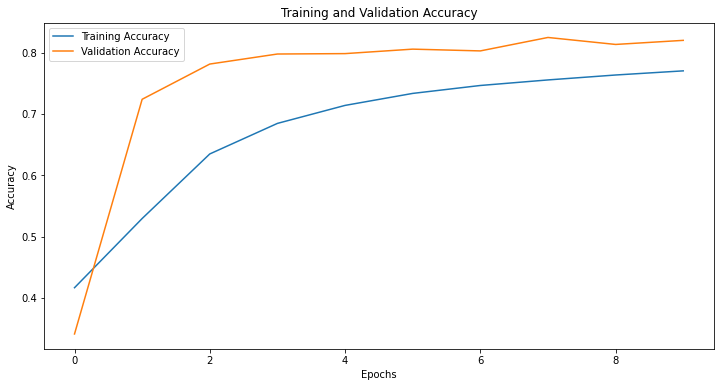

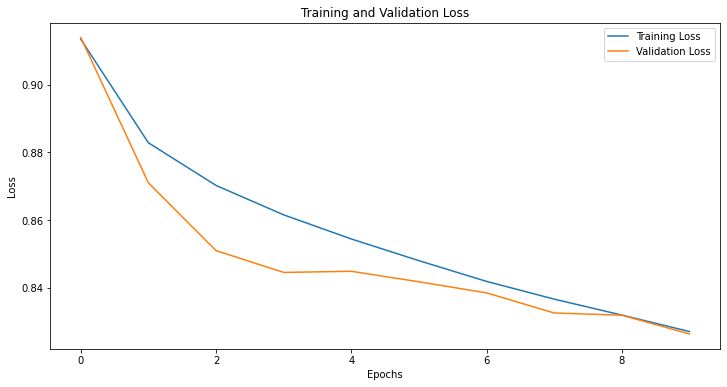

In [41]:
import matplotlib.pyplot as plt

# Retrieve the training accuracy from the history object
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Optionally, retrieve other metrics
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_iou = history.history.get('iou', [])
val_iou = history.history.get('val_iou', [])

# Plotting accuracy
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# Plotting loss
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plotting IoU if available
if train_iou and val_iou:
    plt.figure(figsize=(12, 6))
    plt.plot(train_iou, label='Training IoU')
    plt.plot(val_iou, label='Validation IoU')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.title('Training and Validation IoU')
    plt.legend()
    plt.show()


In [42]:
# Evaluate the model on the validation dataset
loss, accuracy, iou = model.evaluate(val_dataset, steps=VAL_STEPS)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")
print(f"Validation IoU: {iou}")

62/62 [==============================] - 3s 30ms/step - loss: 0.8263 - accuracy: 0.8200 - iou_metric: 0.0952
Validation Loss: 0.8263433575630188
Validation Accuracy: 0.8199585676193237
Validation IoU: 0.09516023099422455


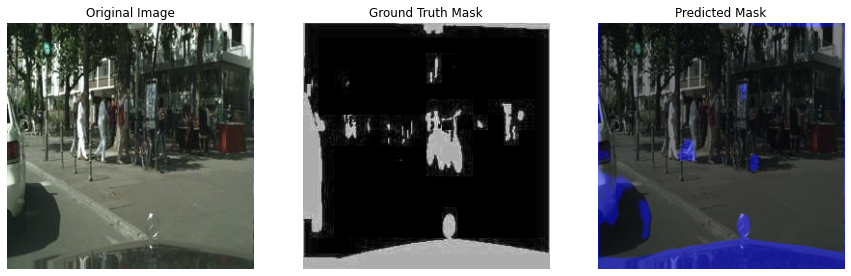

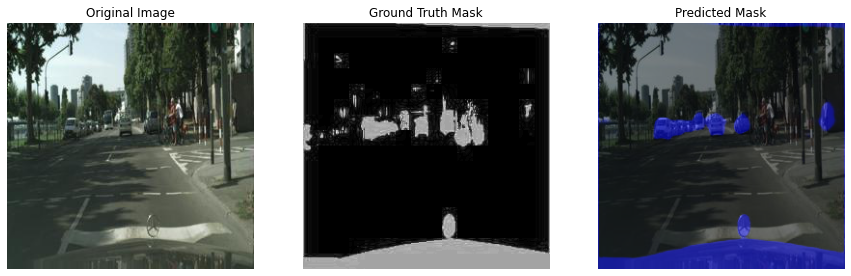

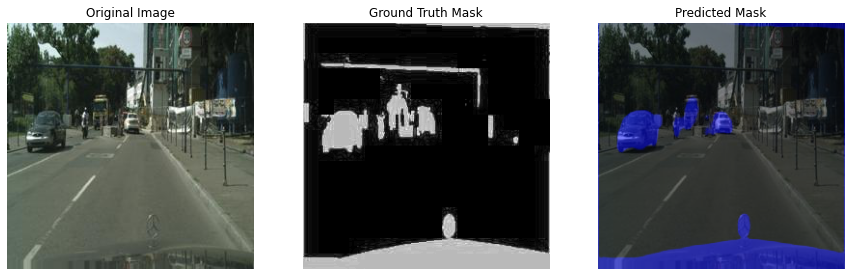

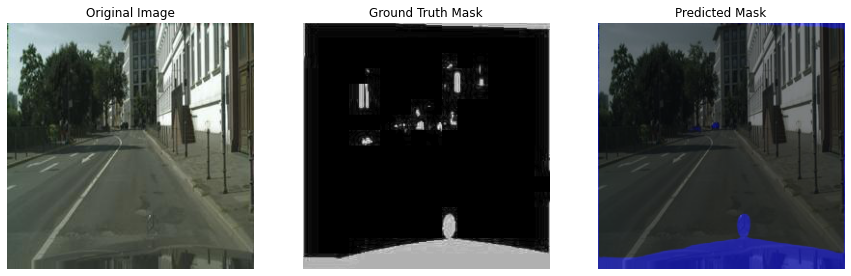

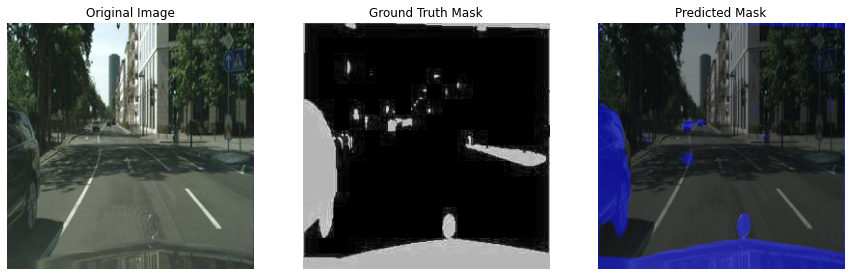

...

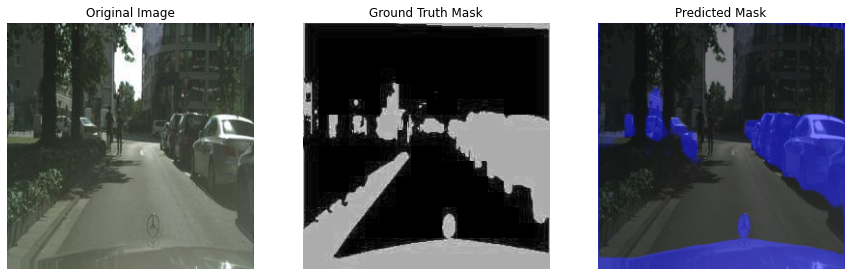

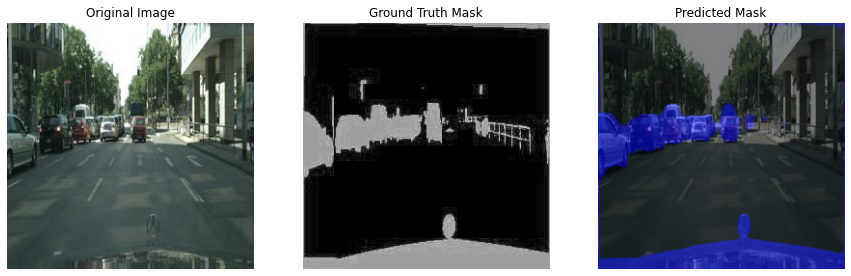

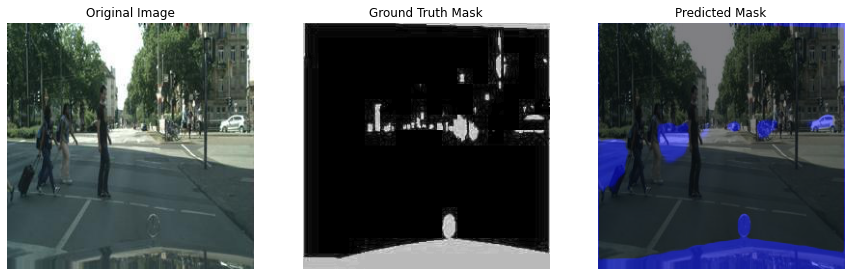

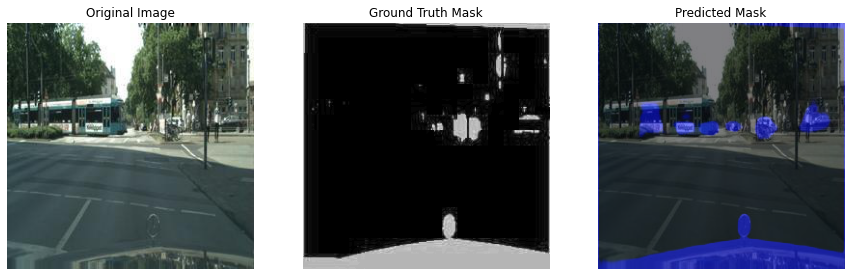

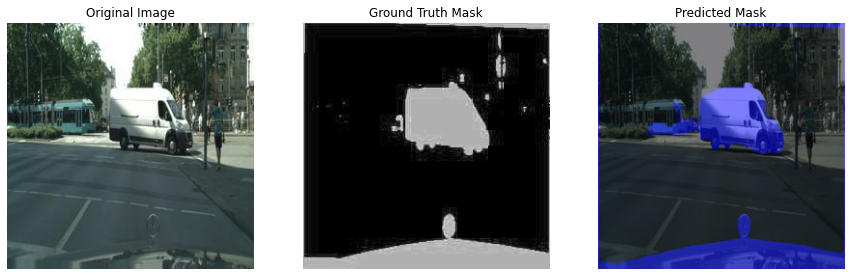

In [43]:
import numpy as np
import matplotlib.pyplot as plt

# Function to visualize segmentation results
def visualize_segmentation(model, dataset, num_samples=3, alpha=0.5):
    dataset_iter = iter(dataset)
    
    for _ in range(num_samples):
        # Get a batch of data
        image_batch, mask_batch = next(dataset_iter)

        # Process each image in the batch
        for i in range(len(image_batch)):
            image = image_batch[i]
            mask = mask_batch[i]
            
            # Predict with the model
            predictions = model.predict(np.expand_dims(image, axis=0))

            # Assuming predictions is (1, 256, 256, 2) shaped
            # Select the first channel (foreground probability) for visualization
            predicted_mask = predictions[0, ..., 0]

            # Normalize the predicted mask to range [0, 1]
            predicted_mask = (predicted_mask - predicted_mask.min()) / (predicted_mask.max() - predicted_mask.min())

            # Create a color mask (e.g., blue) for the overlay
            color_mask = np.zeros_like(image)
            color_mask[:, :, 2] = predicted_mask  # Blue channel

            # Blend the image and the color mask
            overlay_image = (1 - alpha) * image + alpha * color_mask

            # Plot original image
            plt.figure(figsize=(15, 5))
            plt.subplot(1, 3, 1)
            plt.imshow(image)
            plt.title('Original Image')
            plt.axis('off')

            # Plot ground truth mask
            plt.subplot(1, 3, 2)
            plt.imshow(mask[:, :, 0], cmap='gray')  # Assuming mask is (256, 256, 1)
            plt.title('Ground Truth Mask')
            plt.axis('off')

            # Plot overlay image
            plt.subplot(1, 3, 3)
            plt.imshow(overlay_image)
            plt.title('Predicted Mask')
            plt.axis('off')

            plt.show()

# Visualize segmentation results on the validation set
visualize_segmentation(model, val_dataset)


# **Model Evaluation**

# Images Captured from 4 different cameras

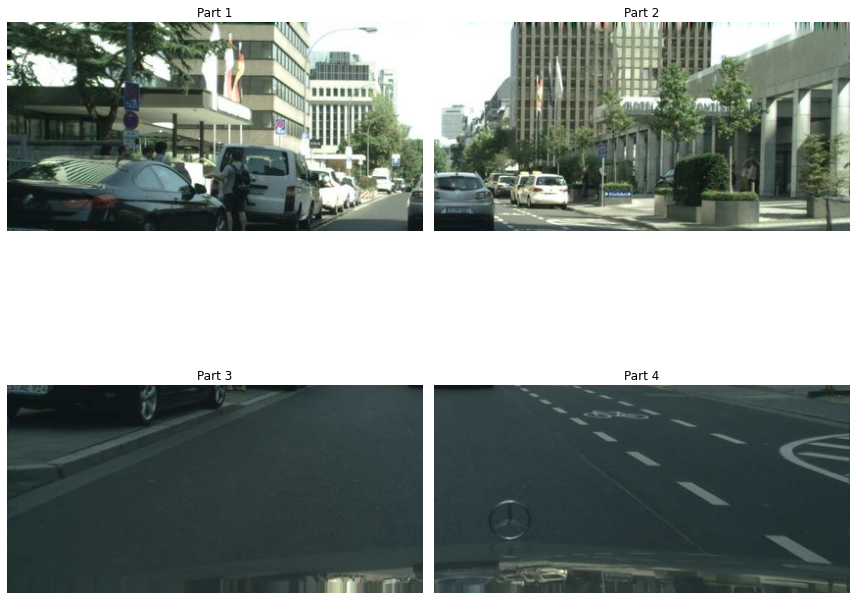

In [44]:
from IPython.display import display
from PIL import Image
import matplotlib.pyplot as plt

# Load each image part from Kaggle input directory
part1_path = '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_001.jpg'
part2_path = '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_002.jpg'
part3_path = '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_003.jpg'
part4_path = '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_004.jpg'

# Load images using PIL
part1 = Image.open(part1_path)
part2 = Image.open(part2_path)
part3 = Image.open(part3_path)
part4 = Image.open(part4_path)

# Display images side by side
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Display part1 and part2 in the first row
axs[0, 0].imshow(part1)
axs[0, 0].axis('off')
axs[0, 0].set_title('Part 1')

axs[0, 1].imshow(part2)
axs[0, 1].axis('off')
axs[0, 1].set_title('Part 2')

# Display part3 and part4 in the second row
axs[1, 0].imshow(part3)
axs[1, 0].axis('off')
axs[1, 0].set_title('Part 3')

axs[1, 1].imshow(part4)
axs[1, 1].axis('off')
axs[1, 1].set_title('Part 4')

plt.tight_layout()
plt.show()


# Prediction on the images captured from 4 different cameras

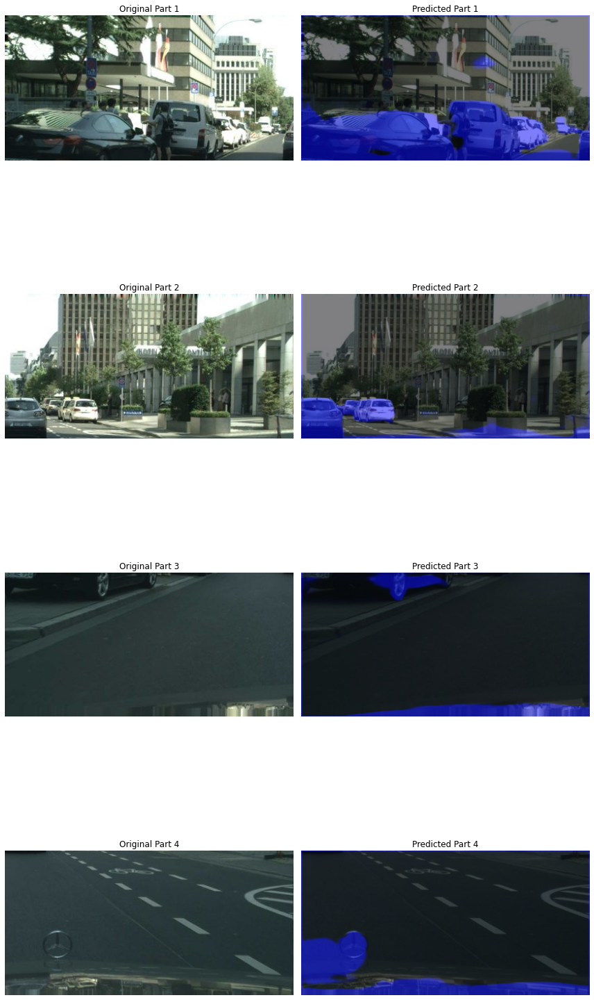

In [56]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Define the input size for the model
input_size = (256, 256)

# Load each image part from Kaggle input directory
part_paths = [
    '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_001.jpg',
    '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_002.jpg',
    '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_003.jpg',
    '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_004.jpg'
]

# Load images using PIL
parts = [Image.open(part_path) for part_path in part_paths]

# Function to preprocess and predict mask for each part
def predict_mask(image_part, model, input_size):
    # Resize the image part to the input size required by the model
    resized_image = image_part.resize(input_size)
    
    # Convert the PIL image to a NumPy array
    input_image = np.array(resized_image)
    
    # Preprocess the image (normalize, scale, etc.)
    input_image = input_image / 255.0  # Normalize if necessary
    
    # Ensure input shape matches the model's expected input shape
    input_image = np.expand_dims(input_image, axis=0)  # Add batch dimension if necessary
    
    # Predict using the loaded model
    predictions = model.predict(input_image)
    
    # Assuming predictions are segmentation masks (output directly from model)
    predicted_mask = predictions[0, ..., 0]  # Assuming batch size is 1 and channel 0 is the mask
    
    # Normalize the predicted mask to range [0, 1]
    predicted_mask = (predicted_mask - predicted_mask.min()) / (predicted_mask.max() - predicted_mask.min())
    
    # Resize predicted mask to match the original part size
    predicted_mask = Image.fromarray((predicted_mask * 255).astype(np.uint8)).resize(image_part.size)
    
    return predicted_mask

# Apply the model prediction to each part and create an overlay image
overlayed_images = []
alpha = 0.5  # Adjust the blending strength as needed

for part in parts:
    predicted_mask = predict_mask(part, model, input_size)
    
    # Create blue mask (RGB format) matching the part size
    blue_mask = np.zeros_like(np.array(part))
    blue_mask[:, :, 2] = np.array(predicted_mask)  # Set blue channel intensity based on predicted mask
    
    # Convert blue mask to PIL Image
    blue_mask_image = Image.fromarray(blue_mask.astype(np.uint8))
    
    # Blend the original part and the blue mask for visualization
    overlayed_image = Image.blend(part.convert('RGBA'), blue_mask_image.convert('RGBA'), alpha)
    overlayed_images.append(overlayed_image)

# Display the original parts and their overlayed images with blue masks side by side
fig, axs = plt.subplots(4, 2, figsize=(12, 24))

for i, part in enumerate(parts):
    axs[i, 0].imshow(part)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f'Original Part {i + 1}')
    
    axs[i, 1].imshow(overlayed_images[i])
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f'Predicted Part {i + 1}')

plt.tight_layout()
plt.show()


# **Image Stitching**

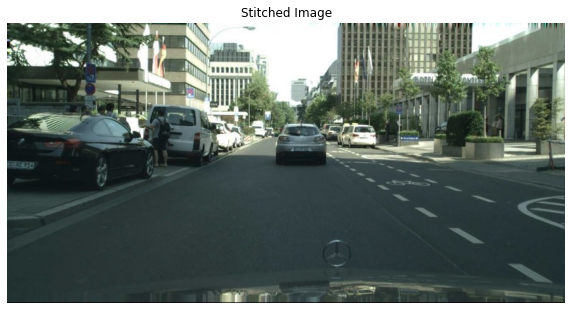

In [45]:
from PIL import Image
import matplotlib.pyplot as plt

# Load each image part from Kaggle input directory
part1_path = '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_001.jpg'
part2_path = '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_002.jpg'
part3_path = '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_003.jpg'
part4_path = '/kaggle/input/image-stitch/divided_parts_cityscape_image/cut_images_WuStzdJMvKGi/image_part_004.jpg'

# Load images using PIL
part1 = Image.open(part1_path)
part2 = Image.open(part2_path)
part3 = Image.open(part3_path)
part4 = Image.open(part4_path)

# Assuming all parts are the same size
width, height = part1.size
total_width = width * 2  # Width of the final image
total_height = height * 2  # Height of the final image

# Create a new blank image (canvas) to paste the parts onto
stitched_image = Image.new('RGB', (total_width, total_height))

# Paste each image part onto the appropriate position on the canvas
stitched_image.paste(part1, (0, 0))
stitched_image.paste(part2, (width, 0))
stitched_image.paste(part3, (0, height))
stitched_image.paste(part4, (width, height))

# Save the stitched image
output_path = '/kaggle/working/stitched_image.jpg'
stitched_image.save(output_path)

# Display the stitched image using Matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(stitched_image)
plt.axis('off')
plt.title('Stitched Image')
plt.show()


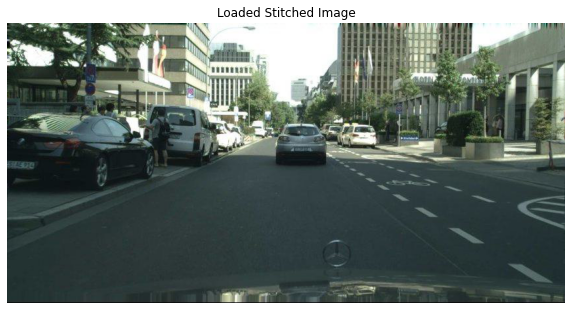

In [46]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the stitched image back from the saved file
loaded_image = Image.open('/kaggle/working/stitched_image.jpg')

# Display the loaded image inline in the notebook
plt.figure(figsize=(10, 8))
plt.imshow(loaded_image)
plt.axis('off')
plt.title('Loaded Stitched Image')
plt.show()


# Load the model trained on 2 classes

In [48]:
from tensorflow.keras.models import load_model

# Define custom objects with the custom loss and metric functions
custom_objects = {'dice_loss': dice_loss, 'iou_metric': iou_metric}

# Path to the saved model file
model_path = '/kaggle/working/model.h5'

# Load the trained UNet model with custom objects
model = load_model(model_path, custom_objects=custom_objects)

# Optionally, summarize the model architecture
model.summary()


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_input (InputLayer)          [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         img_input[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 256, 256, 32) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 32) 128         leaky_re_lu[0][0]                
____________________________________________________________________________________________

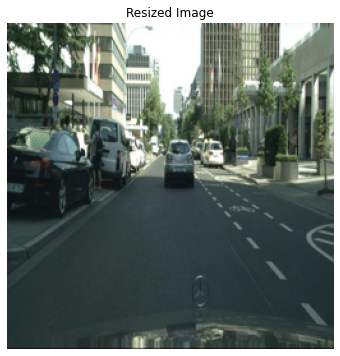

In [49]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the stitched image
stitched_image_path = '/kaggle/working/stitched_image.jpg'
stitched_image = Image.open(stitched_image_path)

# Define the desired input size for your model
input_size = (256, 256)  # Example input size, adjust according to your model

# Resize the stitched image
resized_image = stitched_image.resize(input_size)

# Display the resized image using Matplotlib
plt.figure(figsize=(8, 6))
plt.imshow(resized_image)
plt.axis('off')
plt.title('Resized Image')
plt.show()


# Prediction on the Stitched Image

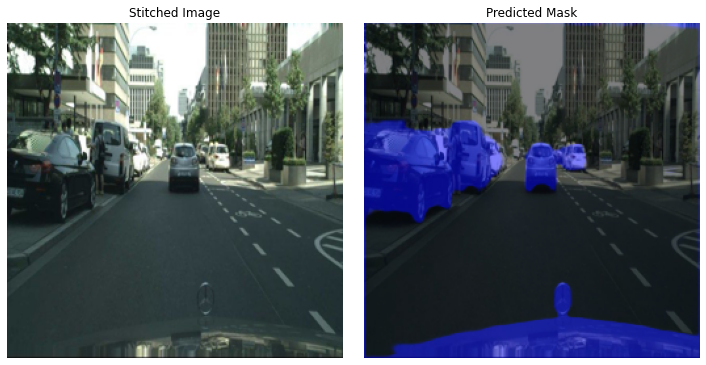

In [50]:
# Assuming input_image is already resized and preprocessed
input_image = np.array(resized_image)
input_image = input_image / 255.0  # Normalize if necessary

# Ensure input shape matches the model's expected input shape
input_image = np.expand_dims(input_image, axis=0)  # Add batch dimension if necessary

# Predict using the loaded model
predictions = model.predict(input_image)

# Assuming predictions is (1, 256, 256, 2) shaped
# Select the first channel (foreground probability) for visualization
predicted_mask = predictions[0, ..., 0]

# Normalize the predicted mask to range [0, 1]
predicted_mask = (predicted_mask - predicted_mask.min()) / (predicted_mask.max() - predicted_mask.min())

# Create a color mask (e.g., blue) for the overlay
color_mask = np.zeros_like(input_image[0], dtype=np.uint8)
color_mask[:, :, 2] = (predicted_mask * 255).astype(np.uint8)  # Blue channel

# Convert input_image to uint8 for blending
input_image_uint8 = (input_image[0] * 255).astype(np.uint8)

# Convert input_image_uint8 to PIL Image
original_image_pil = Image.fromarray(input_image_uint8)

# Blend the original image and the color mask
alpha = 0.5  # Adjust the blending strength as needed
overlayed_image = Image.blend(original_image_pil, Image.fromarray(color_mask), alpha)

# Display the overlayed image using matplotlib
plt.figure(figsize=(15, 5))

# Plot original image
plt.subplot(1, 3, 1)
plt.imshow(input_image_uint8)
plt.title('Stitched Image')
plt.axis('off')

# Plot overlayed image
plt.subplot(1, 3, 2)
plt.imshow(overlayed_image)
plt.title('Predicted Mask')
plt.axis('off')

plt.tight_layout()
plt.show()


# **Prediction on an external image**

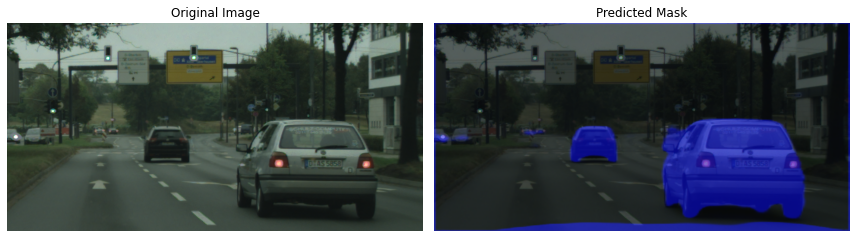

In [53]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Assuming `model` is your trained segmentation model
# `input_size` should be the size expected by your model (e.g., (256, 256))
input_size = (256, 256)

# Path to the external image you want to predict on
external_image_path = '/kaggle/input/input-image/input_test_model.png'

# Load the external image using PIL
external_image = Image.open(external_image_path)

# Resize the image to the input size expected by your model
resized_image = external_image.resize(input_size)

# Convert the PIL image to a NumPy array
input_image = np.array(resized_image)

# Preprocess the image (normalize, scale, etc.)
input_image = input_image / 255.0  # Normalize if necessary

# Ensure input shape matches the model's expected input shape
input_image = np.expand_dims(input_image, axis=0)  # Add batch dimension if necessary

# Predict using the loaded model
predictions = model.predict(input_image)

# Assuming predictions are segmentation masks (output directly from model)
predicted_mask = predictions[0, ..., 0]  # Assuming batch size is 1 and channel 0 is the mask

# Normalize the predicted mask to range [0, 1]
predicted_mask = (predicted_mask - predicted_mask.min()) / (predicted_mask.max() - predicted_mask.min())

# Resize predicted mask to match the original external image size
predicted_mask = Image.fromarray((predicted_mask * 255).astype(np.uint8)).resize(external_image.size)

# Create blue mask (RGB format) matching the external image size
blue_mask = np.zeros_like(np.array(external_image))
blue_mask[:, :, 2] = np.array(predicted_mask)  # Set blue channel intensity based on predicted mask

# Convert blue mask to PIL Image
blue_mask_image = Image.fromarray(blue_mask.astype(np.uint8))

# Blend the original image and the blue mask for visualization
alpha = 0.5  # Adjust the blending strength as needed
overlayed_image = Image.blend(external_image.convert('RGBA'), blue_mask_image.convert('RGBA'), alpha)

# Display the original image and the overlayed image with the blue mask
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(external_image)
plt.title('Original Image')
plt.axis('off')

# Overlayed image with blue mask
plt.subplot(1, 2, 2)
plt.imshow(overlayed_image)
plt.title('Predicted Mask')
plt.axis('off')

plt.tight_layout()
plt.show()


# Prediction on the stitched image 

Images captured from four different cameras at four different angles was stitched together and cropped to retain only the relevant section, then predictions were made on this section.

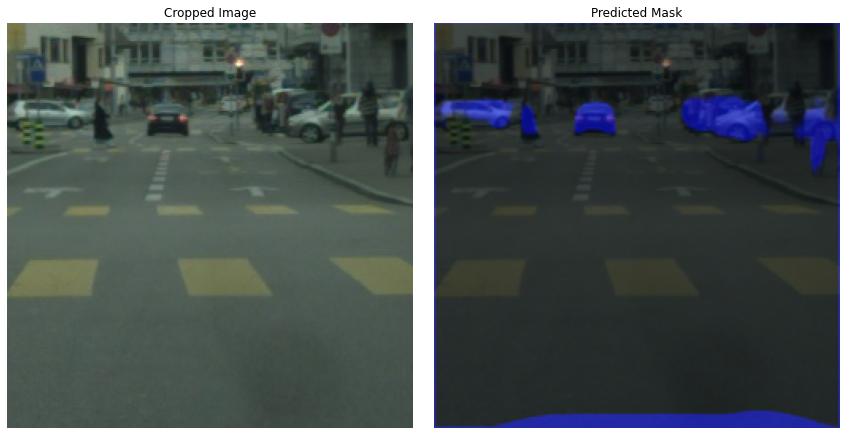

In [54]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Define the input size for the model
input_size = (256, 256)

# Load the stitched image
image_path = '/kaggle/input/input-image/panormic_stitched_image_2.jpg'
image = Image.open(image_path)

# Crop the image (example: crop the central region, you can adjust this)
width, height = image.size
left = (width - input_size[0]) / 2
top = (height - input_size[1]) / 2
right = (width + input_size[0]) / 2
bottom = (height + input_size[1]) / 2

cropped_image = image.crop((left, top, right, bottom))

# Resize the cropped image to the input size required by the model
resized_image = cropped_image.resize(input_size)

# Convert the PIL image to a NumPy array
input_image = np.array(resized_image)

# Preprocess the image (normalize, scale, etc.)
input_image = input_image / 255.0  # Normalize if necessary

# Ensure input shape matches the model's expected input shape
input_image = np.expand_dims(input_image, axis=0)  # Add batch dimension if necessary

# Predict using the loaded model
predictions = model.predict(input_image)

# Assuming predictions are segmentation masks (output directly from model)
predicted_mask = predictions[0, ..., 0]  # Assuming batch size is 1 and channel 0 is the mask

# Normalize the predicted mask to range [0, 1]
predicted_mask = (predicted_mask - predicted_mask.min()) / (predicted_mask.max() - predicted_mask.min())

# Resize predicted mask to match the original cropped image size
predicted_mask = Image.fromarray((predicted_mask * 255).astype(np.uint8)).resize(cropped_image.size)

# Create blue mask (RGB format) matching the cropped image size
blue_mask = np.zeros_like(np.array(cropped_image))
blue_mask[:, :, 2] = np.array(predicted_mask)  # Set blue channel intensity based on predicted mask

# Convert blue mask to PIL Image
blue_mask_image = Image.fromarray(blue_mask.astype(np.uint8))

# Blend the cropped image and the blue mask for visualization
alpha = 0.5  # Adjust the blending strength as needed
overlayed_image = Image.blend(cropped_image.convert('RGBA'), blue_mask_image.convert('RGBA'), alpha)

# Display the original cropped image and the overlayed image with the blue mask
plt.figure(figsize=(12, 6))

# Original cropped image
plt.subplot(1, 2, 1)
plt.imshow(cropped_image)
plt.title('Cropped Image')
plt.axis('off')

# Overlayed image with blue mask
plt.subplot(1, 2, 2)
plt.imshow(overlayed_image)
plt.title('Predicted Mask')
plt.axis('off')

plt.tight_layout()
plt.show()


***